In [ ]:
!pip install split-folders

In [1]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from google.colab import drive
# import splitfolders

from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.tensorboard import SummaryWriter

%matplotlib inline

In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
DATASET_DIR = "/content/drive/MyDrive/AAI_Dataset/CCMT_Dataset"

In [ ]:
# Split folder into train, test and validation set.
# splitfolders.ratio('/content/drive/MyDrive/CCMT_MobileNet/', output="/content/drive/MyDrive/CCMT_MobileNet/SplitDataset/", seed=1337, ratio=(0.8, 0.1, 0.1))

Copying files: 0 files [00:00, ? files/s]


In [4]:
train_dir = DATASET_DIR + "/train"
valid_dir = DATASET_DIR + "/valid"
diseases = os.listdir(train_dir)

diseases = [item for item in diseases]

print(diseases)

['red rust', 'streak virus', 'verticulium wilt', 'septoria leaf spot', 'grasshoper', 'fall armyworm', 'brown spot', 'leaf curl', 'green mite', 'gumosis', 'bacterial blight', 'anthracnose']


In [5]:
print(f"Total classes are: {len(diseases)}")

Total classes are: 12


In [6]:

train_dir = os.path.join(DATASET_DIR, "train")

plants = set()
diseases_count = {}
disease_folders = []


for plant_name in os.listdir(train_dir):
    plant_dir = os.path.join(train_dir, plant_name)
    if os.path.isdir(plant_dir):
        plants.add(plant_name)
        disease_count = 0


        for disease_name in os.listdir(plant_dir):
            disease_dir = os.path.join(plant_dir, disease_name)
            if os.path.isdir(disease_dir):
                num_images = len(os.listdir(disease_dir))
                diseases_count[disease_name] = num_images
                disease_folders.append((plant_name, disease_name, num_images))
                if disease_name.lower() != 'healthy':
                    disease_count += 1


        diseases_count[plant_name] = disease_count

plants = list(plants)


print("Unique plants:", plants)
print("Number of diseases:", sum(diseases_count.values()))



Unique plants: ['verticulium wilt', 'leaf curl', 'bacterial blight', 'red rust', 'fall armyworm', 'septoria leaf spot', 'grasshoper', 'green mite', 'anthracnose', 'gumosis', 'brown spot', 'streak virus']
Number of diseases: 0


In [7]:
# Unique plants
print(f"Number of unique plants are: \n{plants}")

Number of unique plants are: 
['verticulium wilt', 'leaf curl', 'bacterial blight', 'red rust', 'fall armyworm', 'septoria leaf spot', 'grasshoper', 'green mite', 'anthracnose', 'gumosis', 'brown spot', 'streak virus']


In [8]:
# Unique plants count
print(f"Number of unique plants: {len(plants)}")

Number of unique plants: 12


In [9]:
# Unique unique disease count
print(f"Number of unique disease: {diseases_count}")

Number of unique disease: {'red rust': 0, 'streak virus': 0, 'verticulium wilt': 0, 'septoria leaf spot': 0, 'grasshoper': 0, 'fall armyworm': 0, 'brown spot': 0, 'leaf curl': 0, 'green mite': 0, 'gumosis': 0, 'bacterial blight': 0, 'anthracnose': 0}


In [11]:
# Creating a DataFrame to display the number of images per disease per plant
df = pd.DataFrame(disease_folders, columns=['Plant Name', 'Disease', 'Number of Images'])
print(df)

# For a summary view, you might want to group by plant name and count diseases
# summary_df = df.groupby('Plant Name')['Disease'].count().reset_index(name='Number of Diseases')
# print(summary_df)

# nums = {disease: len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases}

# # Converting the nums dictionary to pandas DataFrame with plant name as index and number of images as column
# img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["No. of images"])

# img_per_class

Empty DataFrame
Columns: [Plant Name, Disease, Number of Images]
Index: []


In [12]:
sum([len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases])

4627

In [13]:
nums = {disease: len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases}

# Converting the nums dictionary to pandas DataFrame with plant name as index and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["No. of images"])

img_per_class

,No. of images
red rust,424
streak virus,258
verticulium wilt,321
septoria leaf spot,642
grasshoper,284
fall armyworm,228
brown spot,432
leaf curl,400
green mite,483
gumosis,313


<Figure size 1000x600 with 0 Axes>

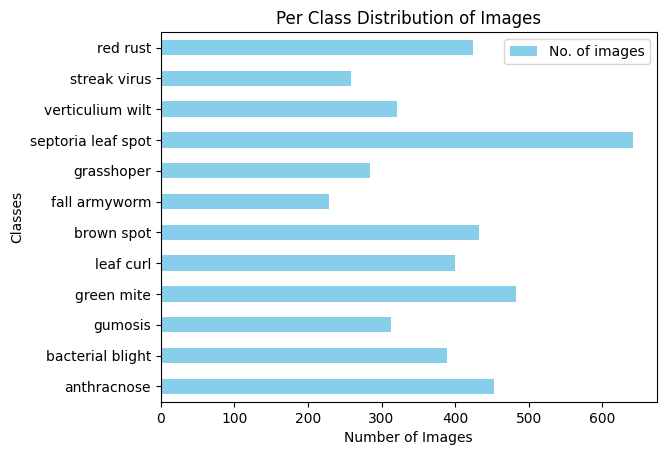

In [14]:
plt.figure(figsize=(10, 6))
img_per_class.plot(kind='barh', color='skyblue')
plt.xlabel('Number of Images')
plt.ylabel('Classes')
plt.title('Per Class Distribution of Images')
plt.gca().invert_yaxis()
plt.show()

In [15]:
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.8, 1.2)),
    transforms.RandomPerspective(distortion_scale=0.1),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])



In [16]:
batch_size=32

In [17]:
def is_valid_file(file_path):
    try:
        # Open the image file
        with open(file_path, 'rb') as f:
            img = Image.open(f)

            # Attempt to load the image to ensure it's valid
            img.load()
             # Verify the integrity of the image file
            img.verify()
            return True
    except Exception as e:
        # If any exception occurs during the process, consider the file as invalid
        return False


In [18]:
train_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/CCMT_Dataset/train', transform=train_transforms, is_valid_file=is_valid_file)
val_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/CCMT_Dataset/val', transform=val_transforms, is_valid_file=is_valid_file)
test_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/CCMT_Dataset/test', transform=val_transforms, is_valid_file=is_valid_file)

In [19]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


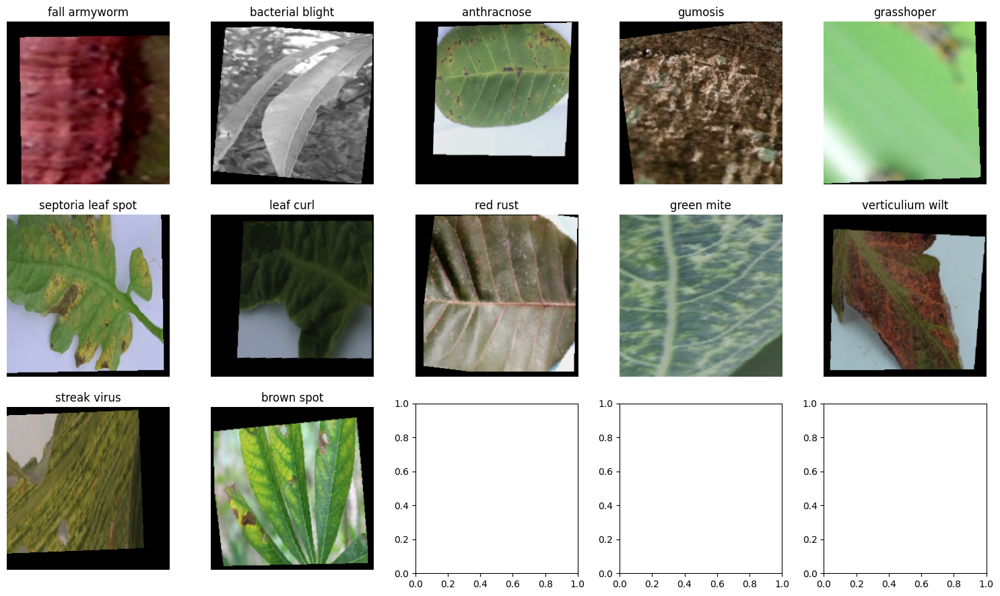

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import math


unique_classes = set()
class_to_idx = train_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

num_classes = len(class_to_idx)
num_rows = math.ceil(num_classes / 5)
num_cols = min(5, num_classes)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3))

if num_rows == 1:
    axes = np.expand_dims(axes, axis=0)

row_index = 0
col_index = 0

for images, labels in train_loader:
    for image, label in zip(images, labels):
        class_name = idx_to_class[label.item()]
        if class_name not in unique_classes:
            unique_classes.add(class_name)
            ax = axes[row_index, col_index]
            img = image.numpy().transpose((1, 2, 0))
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img = std * img + mean
            img = np.clip(img, 0, 1)

            ax.imshow(img)
            ax.set_title(class_name)
            ax.axis('off')

            col_index += 1
            if col_index == num_cols:
                col_index = 0
                row_index += 1

        if len(unique_classes) == num_classes:
            break
    if len(unique_classes) == num_classes:
        break

plt.tight_layout()
plt.show()


In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Device: {device}')
model = models.mobilenet_v2(pretrained=True)
model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


Device: cuda


100%|██████████| 13.6M/13.6M [00:00<00:00, 149MB/s]


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [22]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, weight_decay=1e-5, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [23]:
TENSORBOARD_SUMMARY_PATH=f'{DATASET_DIR}/MendeleyMobile'
writer = SummaryWriter(TENSORBOARD_SUMMARY_PATH)

In [24]:
BEST_MODEL_PATH='/content/drive/MyDrive/CCMT_MobileNet.pth'

In [25]:
early_stopping_patience = 5
epochs_no_improve = 0
val_loss_min = np.Inf

In [26]:
def train_model(num_epochs):
    global epochs_no_improve
    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        # Train the model
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / total
        epoch_acc = correct / total
        writer.add_scalar('Training loss', epoch_loss, epoch)
        writer.add_scalar('Training accuracy', epoch_acc, epoch)

        # Validation
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss = val_running_loss / val_total
        val_accuracy = val_correct / val_total
        writer.add_scalar('Validation loss', val_loss, epoch)
        writer.add_scalar('Validation accuracy', val_accuracy, epoch)

        scheduler.step(val_loss)

        print(f'Epoch [{epoch+1}/{num_epochs}], '
              f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, '
              f'Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), BEST_MODEL_PATH)
        else:
            epochs_no_improve += 1

        if epochs_no_improve == early_stopping_patience:
            print('Early stopping initiated...')
            break

In [27]:
num_epochs = 10
train_model(num_epochs)

Epoch [1/10], Train Loss: 2.0569, Train Acc: 0.5691, Val Loss: 0.5490, Val Acc: 0.8144
Epoch [2/10], Train Loss: 0.8251, Train Acc: 0.7124, Val Loss: 0.4799, Val Acc: 0.8333
Epoch [3/10], Train Loss: 0.6548, Train Acc: 0.7602, Val Loss: 0.4135, Val Acc: 0.8374
Epoch [4/10], Train Loss: 0.6206, Train Acc: 0.7713, Val Loss: 0.2769, Val Acc: 0.8914
Epoch [5/10], Train Loss: 0.5618, Train Acc: 0.7866, Val Loss: 0.3056, Val Acc: 0.8893
Epoch [6/10], Train Loss: 0.5581, Train Acc: 0.7948, Val Loss: 0.3202, Val Acc: 0.8758
Epoch [7/10], Train Loss: 0.5244, Train Acc: 0.8057, Val Loss: 0.3016, Val Acc: 0.8772
Epoch [8/10], Train Loss: 0.4971, Train Acc: 0.8139, Val Loss: 0.2731, Val Acc: 0.8974
Epoch [9/10], Train Loss: 0.4770, Train Acc: 0.8221, Val Loss: 0.3054, Val Acc: 0.8887
Epoch [10/10], Train Loss: 0.4669, Train Acc: 0.8230, Val Loss: 0.3071, Val Acc: 0.8873


In [28]:
# Model evaluation
model.load_state_dict(torch.load(BEST_MODEL_PATH))
model.eval()
test_correct = 0
test_total = 0
all_targets = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_targets.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

test_accuracy = test_correct / test_total
print(f'\n\nTest Accuracy: {test_accuracy:.4f}')

writer.close()



Test Accuracy: 0.8744


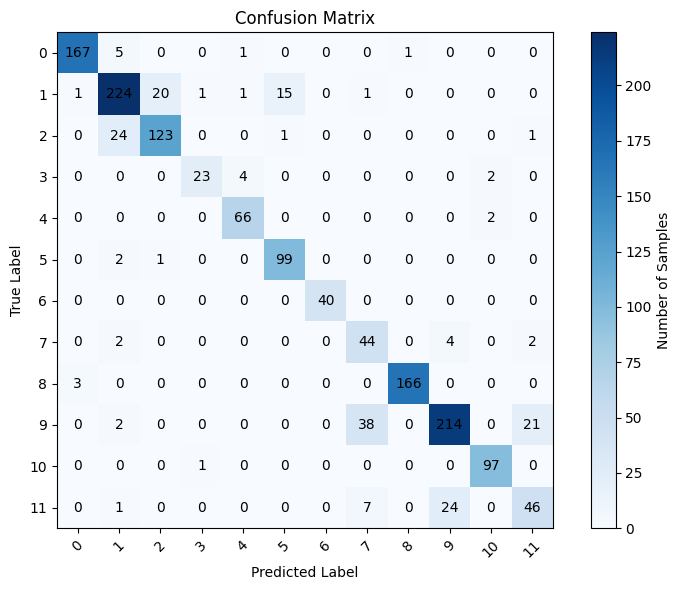

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       174
           1       0.86      0.85      0.86       263
           2       0.85      0.83      0.84       149
           3       0.92      0.79      0.85        29
           4       0.92      0.97      0.94        68
           5       0.86      0.97      0.91       102
           6       1.00      1.00      1.00        40
           7       0.49      0.85      0.62        52
           8       0.99      0.98      0.99       169
           9       0.88      0.78      0.83       275
          10       0.96      0.99      0.97        98
          11       0.66      0.59      0.62        78

    accuracy                           0.87      1497
   macro avg       0.86      0.88      0.87      1497
weighted avg       0.88      0.87      0.88      1497



In [29]:
conf_matrix = confusion_matrix(all_targets, all_predictions)

plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, cmap='Blues', interpolation='nearest')

for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, str(conf_matrix[i, j]), horizontalalignment='center', verticalalignment='center')

plt.title('Confusion Matrix')
plt.colorbar(label='Number of Samples')
plt.xticks(np.arange(len(conf_matrix)), list(set(all_targets)), rotation=45)
plt.yticks(np.arange(len(conf_matrix)), list(set(all_targets)))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()

class_report = classification_report(all_targets, all_predictions)
print("Classification Report:")
print(class_report)

In [ ]:
%load_ext tensorboard
%tensorboard
%tensorboard --logdir {TENSORBOARD_SUMMARY_PATH}

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2024-03-24 15:47:56.420881: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-24 15:47:56.420958: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-24 15:47:56.422213: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-24 15:47:57.419696: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Error: A logdir or db must be specified. For example `tensorboard --logdir mylogdir` or `tensorboard --db sqlite:~/.tensorboard.db`. Run `tensorboard --helpfull` for de

<IPython.core.display.Javascript object>

In [ ]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

# Create an EventAccumulator object for the SummaryWriter's log directory
event_acc = EventAccumulator(TENSORBOARD_SUMMARY_PATH)
event_acc.Reload()

# Get training and validation scalars
train_loss = [event.value for event in event_acc.Scalars('Training loss')]
train_accuracy = [event.value for event in event_acc.Scalars('Training accuracy')]
val_loss = [event.value for event in event_acc.Scalars('Validation loss')]
val_accuracy = [event.value for event in event_acc.Scalars('Validation accuracy')]

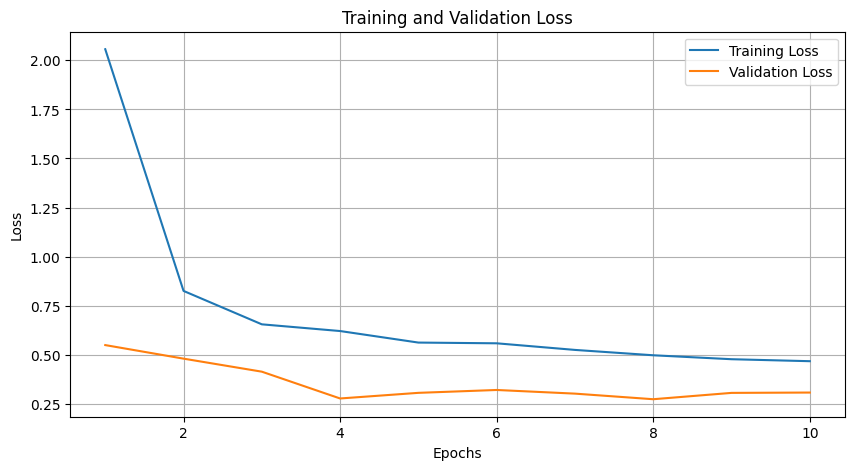

In [31]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(train_loss) + 1), y=train_loss, label='Training Loss')
sns.lineplot(x=range(1, len(validation_loss) + 1), y=validation_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

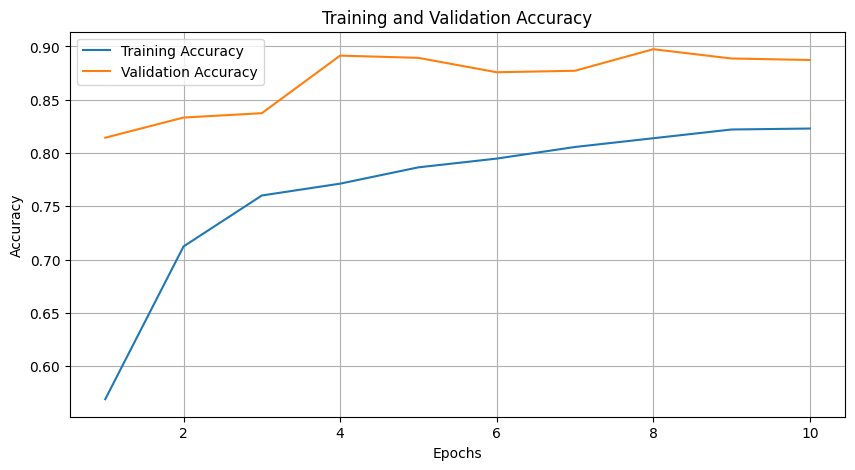

In [32]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(train_accuracy) + 1), y=train_accuracy, label='Training Accuracy')
sns.lineplot(x=range(1, len(val_accuracy) + 1), y=val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [33]:
def extract_features(loader, model, device):
    features = []
    targets = []
    model.eval()
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            features.extend(outputs.cpu().numpy())
            targets.extend(labels.cpu().numpy())
    return np.array(features), np.array(targets)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


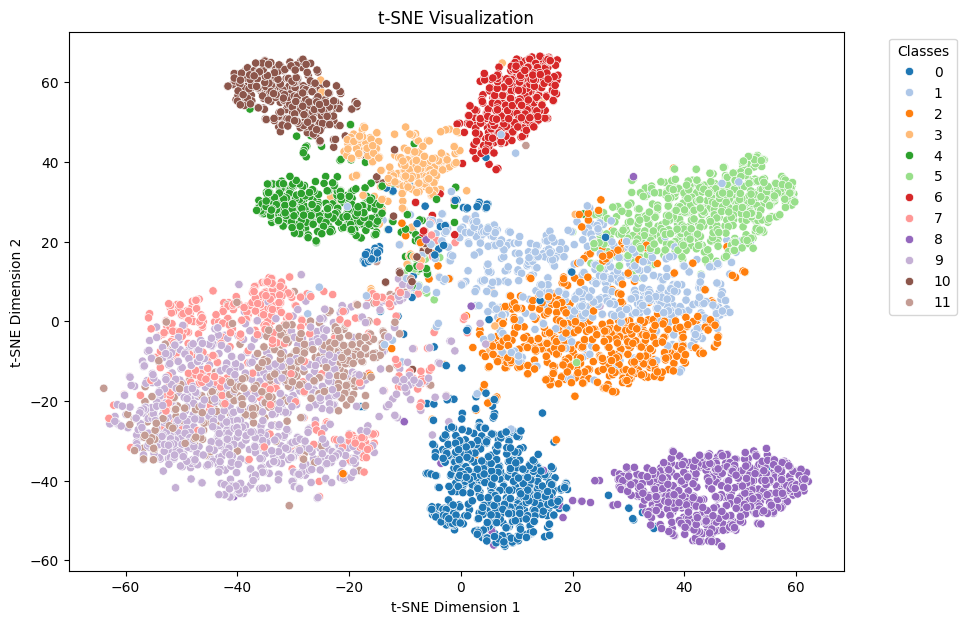

In [35]:
from sklearn.manifold import TSNE
train_features, train_targets = extract_features(train_loader, model, device)
val_features, val_targets = extract_features(val_loader, model, device)

all_features = np.concatenate((train_features, val_features), axis=0)
all_targets = np.concatenate((train_targets, val_targets), axis=0)

tsne = TSNE(n_components=2, random_state=42)
tsne_features = tsne.fit_transform(all_features)


plt.figure(figsize=(10, 7))
sns.scatterplot(x=tsne_features[:, 0], y=tsne_features[:, 1], hue=all_targets, palette='tab20', legend='full')
plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()